In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import datetime
from datetime import date, timedelta
import datetime
import matplotlib.dates as mdates
%matplotlib inline
import pickle

In [2]:
df_covid_hospital = pd.read_csv('https://healthdata.gov/api/views/anag-cw7u/rows.csv?accessType=DOWNLOAD', parse_dates = ['collection_week'])

In [3]:
df_covid_hospital.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 379815 entries, 0 to 379814
Columns: 106 entries, hospital_pk to is_corrected
dtypes: bool(2), datetime64[ns](1), float64(71), int64(23), object(9)
memory usage: 302.1+ MB


https://healthdata.gov/Hospital/COVID-19-Reported-Patient-Impact-and-Hospital-Capa/anag-cw7u

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [5]:
df_covid_hospital.max()

hospital_pk                                                                           ff9032c172057190bf52f523d253c79af2d5f74d007084...
collection_week                                                                                                     2022-01-07 00:00:00
state                                                                                                                                WY
hospital_name                                                                         ZUCKERBERG SAN FRANCISCO GENERAL HOSP & TRAUMA...
zip                                                                                                                             99901.0
hospital_subtype                                                                                                             Short Term
fips_code                                                                                                                       78020.0
is_metro_micro                                  

In [6]:
df_covid_hospital.tail(10)

,hospital_pk,collection_week,state,ccn,hospital_name,address,city,zip,hospital_subtype,fips_code,is_metro_micro,total_beds_7_day_avg,all_adult_hospital_beds_7_day_avg,all_adult_hospital_inpatient_beds_7_day_avg,inpatient_beds_used_7_day_avg,all_adult_hospital_inpatient_bed_occupied_7_day_avg,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg,inpatient_beds_7_day_avg,total_icu_beds_7_day_avg,total_staffed_adult_icu_beds_7_day_avg,icu_beds_used_7_day_avg,staffed_adult_icu_bed_occupancy_7_day_avg,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_avg,staffed_icu_adult_patients_confirmed_covid_7_day_avg,total_patients_hospitalized_confirmed_influenza_7_day_avg,icu_patients_confirmed_influenza_7_day_avg,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_avg,total_beds_7_day_sum,all_adult_hospital_beds_7_day_sum,all_adult_hospital_inpatient_beds_7_day_sum,inpatient_beds_used_7_day_sum,all_adult_hospital_inpatient_bed_occupied_7_day_sum,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_adult_patients_hospitalized_confirmed_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_covid_7_day_sum,inpatient_beds_7_day_sum,total_icu_beds_7_day_sum,total_staffed_adult_icu_beds_7_day_sum,icu_beds_used_7_day_sum,staffed_adult_icu_bed_occupancy_7_day_sum,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum,staffed_icu_adult_patients_confirmed_covid_7_day_sum,total_patients_hospitalized_confirmed_influenza_7_day_sum,icu_patients_confirmed_influenza_7_day_sum,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_sum,total_beds_7_day_coverage,all_adult_hospital_beds_7_day_coverage,all_adult_hospital_inpatient_beds_7_day_coverage,inpatient_beds_used_7_day_coverage,all_adult_hospital_inpatient_bed_occupied_7_day_coverage,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_adult_patients_hospitalized_confirmed_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_covid_7_day_coverage,inpatient_beds_7_day_coverage,total_icu_beds_7_day_coverage,total_staffed_adult_icu_beds_7_day_coverage,icu_beds_used_7_day_coverage,staffed_adult_icu_bed_occupancy_7_day_coverage,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_coverage,staffed_icu_adult_patients_confirmed_covid_7_day_coverage,total_patients_hospitalized_confirmed_influenza_7_day_coverage,icu_patients_confirmed_influenza_7_day_coverage,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_coverage,previous_day_admission_adult_covid_confirmed_7_day_sum,previous_day_admission_adult_covid_confirmed_18-19_7_day_sum,previous_day_admission_adult_covid_confirmed_20-29_7_day_sum,previous_day_admission_adult_covid_confirmed_30-39_7_day_sum,previous_day_admission_adult_covid_confirmed_40-49_7_day_sum,previous_day_admission_adult_covid_confirmed_50-59_7_day_sum,previous_day_admission_adult_covid_confirmed_60-69_7_day_sum,previous_day_admission_adult_covid_confirmed_70-79_7_day_sum,previous_day_admission_adult_covid_confirmed_80+_7_day_sum,previous_day_admission_adult_covid_confirmed_unknown_7_day_sum,previous_day_admission_pediatric_covid_confirmed_7_day_sum,previous_day_covid_ED_visits_7_day_sum,previous_day_admission_adult_covid_suspected_7_day_sum,previous_day_admission_adult_covid_suspected_18-19_7_day_sum,previous_day_admission_adult_covid_suspected_20-29_7_day_sum,previous_day_admission_adult_covid_suspected_30-39_7_day_sum,previous_day_admission_adult_covid_suspected_40-49_7_day_sum,previous_day_admission_adult_covid_suspected_50-59_7_day_sum,previous_day_admission_adult

In [7]:
df_covid_hospital.shape

(379815, 106)

In [8]:
df_covid_hospital.sort_values(by ='collection_week', ascending = False).head()

,hospital_pk,collection_week,state,ccn,hospital_name,address,city,zip,hospital_subtype,fips_code,is_metro_micro,total_beds_7_day_avg,all_adult_hospital_beds_7_day_avg,all_adult_hospital_inpatient_beds_7_day_avg,inpatient_beds_used_7_day_avg,all_adult_hospital_inpatient_bed_occupied_7_day_avg,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg,inpatient_beds_7_day_avg,total_icu_beds_7_day_avg,total_staffed_adult_icu_beds_7_day_avg,icu_beds_used_7_day_avg,staffed_adult_icu_bed_occupancy_7_day_avg,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_avg,staffed_icu_adult_patients_confirmed_covid_7_day_avg,total_patients_hospitalized_confirmed_influenza_7_day_avg,icu_patients_confirmed_influenza_7_day_avg,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_avg,total_beds_7_day_sum,all_adult_hospital_beds_7_day_sum,all_adult_hospital_inpatient_beds_7_day_sum,inpatient_beds_used_7_day_sum,all_adult_hospital_inpatient_bed_occupied_7_day_sum,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_adult_patients_hospitalized_confirmed_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_covid_7_day_sum,inpatient_beds_7_day_sum,total_icu_beds_7_day_sum,total_staffed_adult_icu_beds_7_day_sum,icu_beds_used_7_day_sum,staffed_adult_icu_bed_occupancy_7_day_sum,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum,staffed_icu_adult_patients_confirmed_covid_7_day_sum,total_patients_hospitalized_confirmed_influenza_7_day_sum,icu_patients_confirmed_influenza_7_day_sum,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_sum,total_beds_7_day_coverage,all_adult_hospital_beds_7_day_coverage,all_adult_hospital_inpatient_beds_7_day_coverage,inpatient_beds_used_7_day_coverage,all_adult_hospital_inpatient_bed_occupied_7_day_coverage,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_adult_patients_hospitalized_confirmed_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_covid_7_day_coverage,inpatient_beds_7_day_coverage,total_icu_beds_7_day_coverage,total_staffed_adult_icu_beds_7_day_coverage,icu_beds_used_7_day_coverage,staffed_adult_icu_bed_occupancy_7_day_coverage,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_coverage,staffed_icu_adult_patients_confirmed_covid_7_day_coverage,total_patients_hospitalized_confirmed_influenza_7_day_coverage,icu_patients_confirmed_influenza_7_day_coverage,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_coverage,previous_day_admission_adult_covid_confirmed_7_day_sum,previous_day_admission_adult_covid_confirmed_18-19_7_day_sum,previous_day_admission_adult_covid_confirmed_20-29_7_day_sum,previous_day_admission_adult_covid_confirmed_30-39_7_day_sum,previous_day_admission_adult_covid_confirmed_40-49_7_day_sum,previous_day_admission_adult_covid_confirmed_50-59_7_day_sum,previous_day_admission_adult_covid_confirmed_60-69_7_day_sum,previous_day_admission_adult_covid_confirmed_70-79_7_day_sum,previous_day_admission_adult_covid_confirmed_80+_7_day_sum,previous_day_admission_adult_covid_confirmed_unknown_7_day_sum,previous_day_admission_pediatric_covid_confirmed_7_day_sum,previous_day_covid_ED_visits_7_day_sum,previous_day_admission_adult_covid_suspected_7_day_sum,previous_day_admission_adult_covid_suspected_18-19_7_day_sum,previous_day_admission_adult_covid_suspected_20-29_7_day_sum,previous_day_admission_adult_covid_suspected_30-39_7_day_sum,previous_day_admission_adult_covid_suspected_40-49_7_day_sum,previous_day_admission_adult_covid_suspected_50-59_7_day_sum,previous_day_admission_adult

In [9]:
type(df_covid_hospital.collection_week)

pandas.core.series.Series

In [10]:
for x in df_covid_hospital.columns:
    print(x)

hospital_pk
collection_week
state
ccn
hospital_name
address
city
zip
hospital_subtype
fips_code
is_metro_micro
total_beds_7_day_avg
all_adult_hospital_beds_7_day_avg
all_adult_hospital_inpatient_beds_7_day_avg
inpatient_beds_used_7_day_avg
all_adult_hospital_inpatient_bed_occupied_7_day_avg
total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg
total_adult_patients_hospitalized_confirmed_covid_7_day_avg
total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg
total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg
inpatient_beds_7_day_avg
total_icu_beds_7_day_avg
total_staffed_adult_icu_beds_7_day_avg
icu_beds_used_7_day_avg
staffed_adult_icu_bed_occupancy_7_day_avg
staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_avg
staffed_icu_adult_patients_confirmed_covid_7_day_avg
total_patients_hospitalized_confirmed_influenza_7_day_avg
icu_patients_confirmed_influenza_7_day_avg
total_patients_hospitalized_confirmed_influenza_and_covi

In [11]:
df_covid_hospital.dtypes.value_counts()

float64           71
int64             23
object             9
bool               2
datetime64[ns]     1
dtype: int64

In [12]:
df_covid_hospital.index

RangeIndex(start=0, stop=379815, step=1)

In [13]:
df_covid_hospital.ndim

2

In [14]:
df_covid_hospital.size

40260390

In [15]:
df_covid_hospital.count()

hospital_pk                                                                           379815
collection_week                                                                       379815
state                                                                                 379815
ccn                                                                                   379040
hospital_name                                                                         379815
address                                                                               379574
city                                                                                  379574
zip                                                                                   379814
hospital_subtype                                                                      379815
fips_code                                                                             379361
is_metro_micro                                                        

In [16]:
df_covid_hospital.nunique()

hospital_pk                                                                           5077
collection_week                                                                         76
state                                                                                   56
ccn                                                                                   5053
hospital_name                                                                         4924
address                                                                               5021
city                                                                                  2938
zip                                                                                   4467
hospital_subtype                                                                         4
fips_code                                                                             2473
is_metro_micro                                                                           2

In [17]:
df_covid_hospital.max()

hospital_pk                                                                           ff9032c172057190bf52f523d253c79af2d5f74d007084...
collection_week                                                                                                     2022-01-07 00:00:00
state                                                                                                                                WY
hospital_name                                                                         ZUCKERBERG SAN FRANCISCO GENERAL HOSP & TRAUMA...
zip                                                                                                                             99901.0
hospital_subtype                                                                                                             Short Term
fips_code                                                                                                                       78020.0
is_metro_micro                                  

In [18]:
df_covid_hospital[df_covid_hospital.city == 'SAN ANTONIO'].max()

hospital_pk                                                                                                 670125
collection_week                                                                                2022-01-07 00:00:00
state                                                                                                           TX
ccn                                                                                                         670125
hospital_name                                                                             UNIVERSITY HEALTH SYSTEM
address                                                                                          9522 HUEBNER ROAD
city                                                                                                   SAN ANTONIO
zip                                                                                                        78258.0
hospital_subtype                                                                

In [19]:
df_covid_hospital[(df_covid_hospital.city == 'SAN ANTONIO') & (df_covid_hospital.collection_week == '2022-01-07')][['hospital_pk','hospital_name','address','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

,hospital_pk,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
981,452073,KINDRED HOSPITAL- SAN ANTONIO CENTRAL,111 DALLAS STREET 4TH FLOOR,0.0
1782,450697,TEXAS VISTA MEDICAL CENTER,7400 BARLITE BLVD,-999999.0
2122,670125,TEXAS CENTER FOR INFECTIOUS DISEASE,2303 SE MILITARY DR P O BOX 23340,0.0
2917,452090,PAM SPECIALTY HOSPITAL OF SAN ANTONIO,5418 N LOOP 1604 W,0.0
3608,453315,CHILDREN'S HOSPITAL OF SAN ANTONIO,333 N SANTA ROSA ST,12.0
3928,450237,CHRISTUS SANTA ROSA MEDICAL CENTER,2827 BABCOCK ROAD,0.0
4771,670054,FOUNDATION SURGICAL HOSPITAL OF SAN ANTONIO,9522 HUEBNER ROAD,0.0
6022,670112,LEGENT ORTHOPEDIC + SPINE,5330 NORTH LOOP 1604 WEST,0.0
6209,452016,KINDRED HOSPITAL SAN ANTONIO,3636 MEDICAL DRIVE,0.0
6953,670055,METHODIST HOSPITAL STONE OAK,"1139 E SONTERRA BLVD,",0.0


In [20]:
df_covid_hospital.collection_week.unique().max()

numpy.datetime64('2022-01-07T00:00:00.000000000')

In [21]:
df_covid_hospital[(df_covid_hospital.city == 'SAN ANTONIO') & (df_covid_hospital.collection_week == '2022-01-07')][['hospital_name','previous_day_admission_adult_covid_confirmed_7_day_sum']]

,hospital_name,previous_day_admission_adult_covid_confirmed_7_day_sum
981,KINDRED HOSPITAL- SAN ANTONIO CENTRAL,0.0
1782,TEXAS VISTA MEDICAL CENTER,41.0
2122,TEXAS CENTER FOR INFECTIOUS DISEASE,0.0
2917,PAM SPECIALTY HOSPITAL OF SAN ANTONIO,7.0
3608,CHILDREN'S HOSPITAL OF SAN ANTONIO,-999999.0
3928,CHRISTUS SANTA ROSA MEDICAL CENTER,109.0
4771,FOUNDATION SURGICAL HOSPITAL OF SAN ANTONIO,0.0
6022,LEGENT ORTHOPEDIC + SPINE,0.0
6209,KINDRED HOSPITAL SAN ANTONIO,0.0
6953,METHODIST HOSPITAL STONE OAK,28.0


In [22]:
df_covid_hospital[(df_covid_hospital.city == 'SAN ANTONIO') & (df_covid_hospital.collection_week == '2021-12-10')][['previous_day_admission_adult_covid_confirmed_7_day_sum']]

,previous_day_admission_adult_covid_confirmed_7_day_sum
14520,29.0
15282,9.0
15321,46.0
16062,-999999.0
16686,0.0
18733,0.0
19147,15.0
19456,0.0
19701,0.0
19712,0.0


In [23]:
aaa = list(df_covid_hospital.collection_week.unique())

In [24]:
aaa

[numpy.datetime64('2022-01-07T00:00:00.000000000'),
 numpy.datetime64('2021-12-31T00:00:00.000000000'),
 numpy.datetime64('2021-12-24T00:00:00.000000000'),
 numpy.datetime64('2021-12-17T00:00:00.000000000'),
 numpy.datetime64('2021-12-10T00:00:00.000000000'),
 numpy.datetime64('2021-12-03T00:00:00.000000000'),
 numpy.datetime64('2021-11-26T00:00:00.000000000'),
 numpy.datetime64('2021-11-12T00:00:00.000000000'),
 numpy.datetime64('2021-11-05T00:00:00.000000000'),
 numpy.datetime64('2021-10-29T00:00:00.000000000'),
 numpy.datetime64('2021-10-22T00:00:00.000000000'),
 numpy.datetime64('2021-10-15T00:00:00.000000000'),
 numpy.datetime64('2021-10-08T00:00:00.000000000'),
 numpy.datetime64('2021-10-01T00:00:00.000000000'),
 numpy.datetime64('2021-09-24T00:00:00.000000000'),
 numpy.datetime64('2021-09-17T00:00:00.000000000'),
 numpy.datetime64('2021-09-10T00:00:00.000000000'),
 numpy.datetime64('2021-09-03T00:00:00.000000000'),
 numpy.datetime64('2021-08-27T00:00:00.000000000'),
 numpy.datet

In [25]:
aaa.sort()

In [26]:
aaa

[numpy.datetime64('2020-07-31T00:00:00.000000000'),
 numpy.datetime64('2020-08-07T00:00:00.000000000'),
 numpy.datetime64('2020-08-14T00:00:00.000000000'),
 numpy.datetime64('2020-08-21T00:00:00.000000000'),
 numpy.datetime64('2020-08-28T00:00:00.000000000'),
 numpy.datetime64('2020-09-04T00:00:00.000000000'),
 numpy.datetime64('2020-09-11T00:00:00.000000000'),
 numpy.datetime64('2020-09-18T00:00:00.000000000'),
 numpy.datetime64('2020-09-25T00:00:00.000000000'),
 numpy.datetime64('2020-10-02T00:00:00.000000000'),
 numpy.datetime64('2020-10-09T00:00:00.000000000'),
 numpy.datetime64('2020-10-16T00:00:00.000000000'),
 numpy.datetime64('2020-10-23T00:00:00.000000000'),
 numpy.datetime64('2020-10-30T00:00:00.000000000'),
 numpy.datetime64('2020-11-06T00:00:00.000000000'),
 numpy.datetime64('2020-11-13T00:00:00.000000000'),
 numpy.datetime64('2020-11-20T00:00:00.000000000'),
 numpy.datetime64('2020-11-27T00:00:00.000000000'),
 numpy.datetime64('2020-12-04T00:00:00.000000000'),
 numpy.datet

In [27]:
aaa = df_covid_hospital[df_covid_hospital.hospital_pk == '450388'][['collection_week','hospital_name','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]
 

In [28]:
bbb = aaa.sort_values(by = 'collection_week')

In [29]:
ccc = bbb.set_index('collection_week')


In [30]:
ddd = ccc[ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0][['previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [31]:
ccc

,hospital_name,previous_day_admission_pediatric_covid_confirmed_7_day_sum
collection_week,,
2020-07-31,METHODIST HOSPITAL,8.0
2020-08-07,METHODIST HOSPITAL,-999999.0
2020-08-14,METHODIST HOSPITAL,0.0
2020-08-21,METHODIST HOSPITAL,6.0
2020-08-28,METHODIST HOSPITAL,7.0
2020-09-04,METHODIST HOSPITAL,9.0
2020-09-11,METHODIST HOSPITAL,-999999.0
2020-09-18,METHODIST HOSPITAL,4.0
2020-09-25,METHODIST HOSPITAL,0.0


In [32]:
ddd_rolling = ddd.rolling(7).mean().shift()

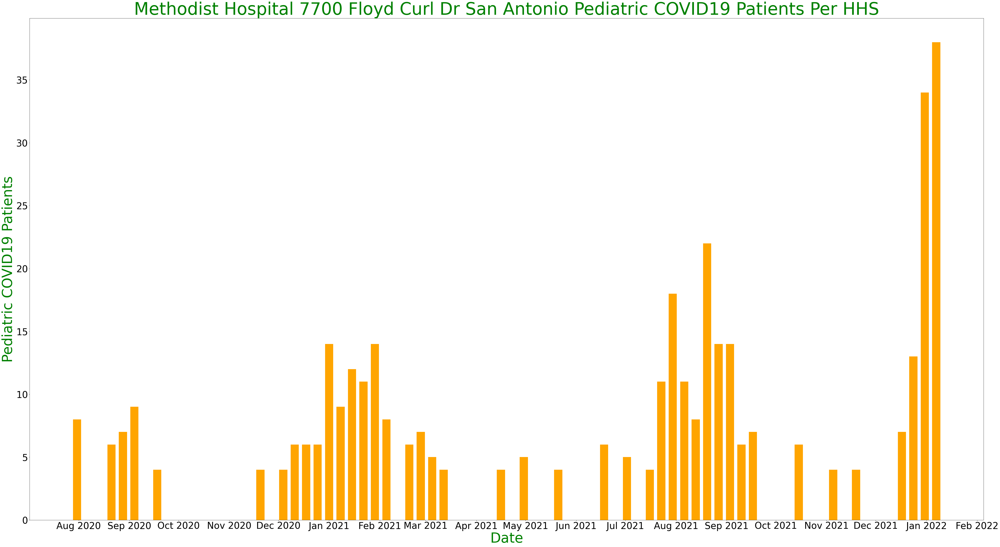

In [34]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Methodist Hospital 7700 Floyd Curl Dr San Antonio Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(ddd.index, ddd.previous_day_admission_pediatric_covid_confirmed_7_day_sum, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_Methodist_Pediatric.png')

In [35]:
aaa = df_covid_hospital[df_covid_hospital.hospital_pk == '453315'][['collection_week','hospital_name','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [36]:
bbb = aaa.sort_values(by = 'collection_week')

In [37]:
ccc = bbb.set_index('collection_week')

In [38]:
ddd = ccc[ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0][['previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

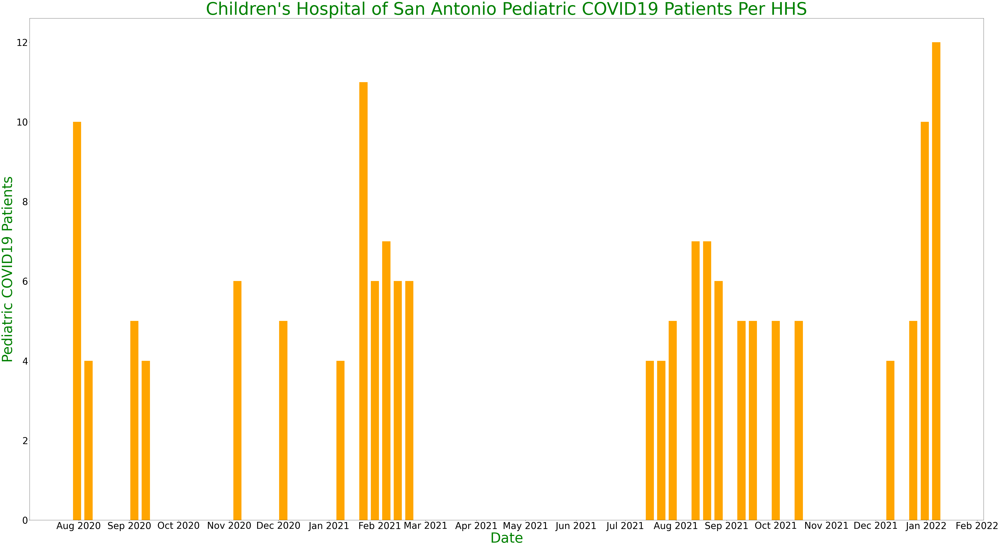

In [39]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Children\'s Hospital of San Antonio Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(ddd.index, ddd.previous_day_admission_pediatric_covid_confirmed_7_day_sum, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_Childrens_Pediatric.png')

In [40]:
aaa = df_covid_hospital[df_covid_hospital.hospital_pk == '450213'][['collection_week','hospital_name','address','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [41]:
aaa

,collection_week,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
8897,2022-01-07,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,11.0
10653,2021-12-31,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,6.0
13941,2021-12-17,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,-999999.0
19147,2021-12-10,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,-999999.0
24326,2021-12-24,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,6.0
32376,2021-12-03,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,7.0
32880,2021-11-26,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,-999999.0
44929,2021-11-19,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,4.0
44987,2021-11-12,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,6.0
51653,2021-11-05,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,4.0


In [42]:
bbb = aaa.sort_values(by = 'collection_week')
ccc = bbb.set_index('collection_week')
ddd = ccc[ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0][['previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

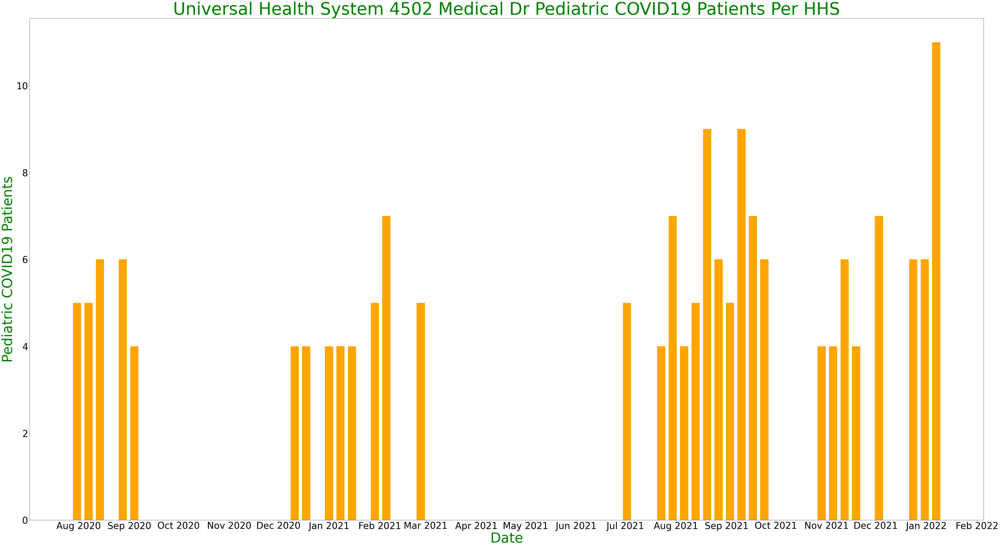

In [43]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Universal Health System 4502 Medical Dr Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(ddd.index, ddd.previous_day_admission_pediatric_covid_confirmed_7_day_sum, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_Universal_Pediatric.png')

In [44]:
aaa = df_covid_hospital[df_covid_hospital.hospital_pk == '450058'][['collection_week','hospital_name','address','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [45]:
aaa

,collection_week,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
9012,2021-12-31,BAPTIST MEDICAL CENTER,111 DALLAS STREET,7.0
10780,2022-01-07,BAPTIST MEDICAL CENTER,111 DALLAS STREET,10.0
15321,2021-12-10,BAPTIST MEDICAL CENTER,111 DALLAS STREET,-999999.0
17389,2021-12-24,BAPTIST MEDICAL CENTER,111 DALLAS STREET,5.0
23738,2021-12-17,BAPTIST MEDICAL CENTER,111 DALLAS STREET,-999999.0
27361,2021-11-26,BAPTIST MEDICAL CENTER,111 DALLAS STREET,-999999.0
38367,2021-12-03,BAPTIST MEDICAL CENTER,111 DALLAS STREET,6.0
39515,2021-11-05,BAPTIST MEDICAL CENTER,111 DALLAS STREET,-999999.0
43085,2021-11-19,BAPTIST MEDICAL CENTER,111 DALLAS STREET,4.0
43456,2021-11-12,BAPTIST MEDICAL CENTER,111 DALLAS STREET,-999999.0


In [46]:
bbb = aaa.sort_values(by = 'collection_week')
ccc = bbb.set_index('collection_week')
ddd = ccc[ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0][['previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [47]:
ddd

,previous_day_admission_pediatric_covid_confirmed_7_day_sum
collection_week,
2020-08-14,0.0
2020-08-21,0.0
2020-08-28,0.0
2020-09-04,0.0
2020-09-11,0.0
2020-09-18,0.0
2020-10-02,0.0
2020-10-09,0.0
2020-10-16,0.0


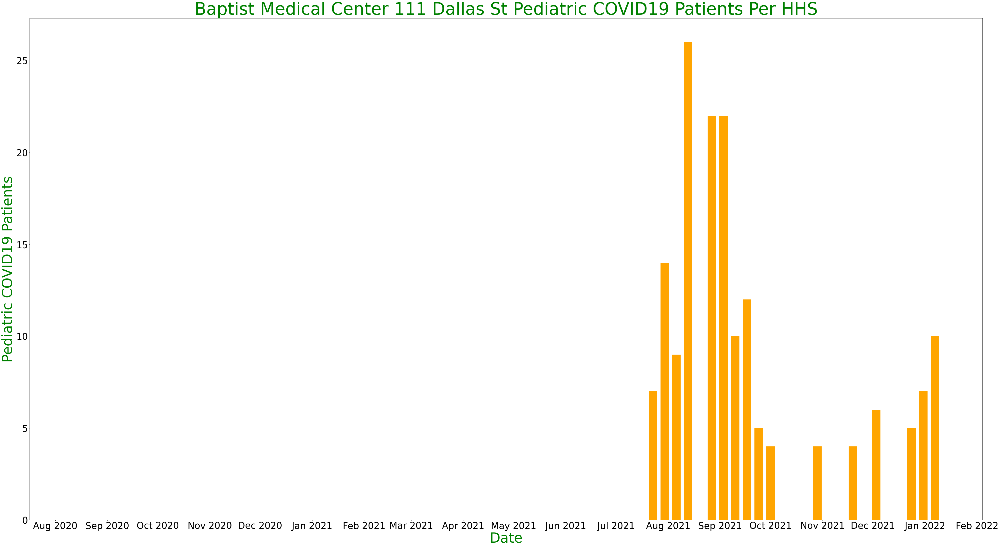

In [48]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Baptist Medical Center 111 Dallas St Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(ddd.index, ddd.previous_day_admission_pediatric_covid_confirmed_7_day_sum, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_Baptist_Pediatric.png')

In [49]:
aaa = df_covid_hospital[(df_covid_hospital.city == 'SAN ANTONIO') & (df_covid_hospital.collection_week == '2022-01-07')][['hospital_pk','hospital_name','address','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [50]:
bbb = aaa[aaa.previous_day_admission_pediatric_covid_confirmed_7_day_sum >=0]

In [51]:
aaa

,hospital_pk,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
981,452073,KINDRED HOSPITAL- SAN ANTONIO CENTRAL,111 DALLAS STREET 4TH FLOOR,0.0
1782,450697,TEXAS VISTA MEDICAL CENTER,7400 BARLITE BLVD,-999999.0
2122,670125,TEXAS CENTER FOR INFECTIOUS DISEASE,2303 SE MILITARY DR P O BOX 23340,0.0
2917,452090,PAM SPECIALTY HOSPITAL OF SAN ANTONIO,5418 N LOOP 1604 W,0.0
3608,453315,CHILDREN'S HOSPITAL OF SAN ANTONIO,333 N SANTA ROSA ST,12.0
3928,450237,CHRISTUS SANTA ROSA MEDICAL CENTER,2827 BABCOCK ROAD,0.0
4771,670054,FOUNDATION SURGICAL HOSPITAL OF SAN ANTONIO,9522 HUEBNER ROAD,0.0
6022,670112,LEGENT ORTHOPEDIC + SPINE,5330 NORTH LOOP 1604 WEST,0.0
6209,452016,KINDRED HOSPITAL SAN ANTONIO,3636 MEDICAL DRIVE,0.0
6953,670055,METHODIST HOSPITAL STONE OAK,"1139 E SONTERRA BLVD,",0.0


In [52]:
bbb

,hospital_pk,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
981,452073,KINDRED HOSPITAL- SAN ANTONIO CENTRAL,111 DALLAS STREET 4TH FLOOR,0.0
2122,670125,TEXAS CENTER FOR INFECTIOUS DISEASE,2303 SE MILITARY DR P O BOX 23340,0.0
2917,452090,PAM SPECIALTY HOSPITAL OF SAN ANTONIO,5418 N LOOP 1604 W,0.0
3608,453315,CHILDREN'S HOSPITAL OF SAN ANTONIO,333 N SANTA ROSA ST,12.0
3928,450237,CHRISTUS SANTA ROSA MEDICAL CENTER,2827 BABCOCK ROAD,0.0
4771,670054,FOUNDATION SURGICAL HOSPITAL OF SAN ANTONIO,9522 HUEBNER ROAD,0.0
6022,670112,LEGENT ORTHOPEDIC + SPINE,5330 NORTH LOOP 1604 WEST,0.0
6209,452016,KINDRED HOSPITAL SAN ANTONIO,3636 MEDICAL DRIVE,0.0
6953,670055,METHODIST HOSPITAL STONE OAK,"1139 E SONTERRA BLVD,",0.0
7951,450856,SOUTH TEXAS SPINE AND SURGICAL HOSPITAL,18600 NORTH HARDY OAK BLVD,0.0


In [54]:
aaa = df_covid_hospital[df_covid_hospital.city == 'SAN ANTONIO']

In [55]:
aaa

,hospital_pk,collection_week,state,ccn,hospital_name,address,city,zip,hospital_subtype,fips_code,is_metro_micro,total_beds_7_day_avg,all_adult_hospital_beds_7_day_avg,all_adult_hospital_inpatient_beds_7_day_avg,inpatient_beds_used_7_day_avg,all_adult_hospital_inpatient_bed_occupied_7_day_avg,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg,inpatient_beds_7_day_avg,total_icu_beds_7_day_avg,total_staffed_adult_icu_beds_7_day_avg,icu_beds_used_7_day_avg,staffed_adult_icu_bed_occupancy_7_day_avg,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_avg,staffed_icu_adult_patients_confirmed_covid_7_day_avg,total_patients_hospitalized_confirmed_influenza_7_day_avg,icu_patients_confirmed_influenza_7_day_avg,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_avg,total_beds_7_day_sum,all_adult_hospital_beds_7_day_sum,all_adult_hospital_inpatient_beds_7_day_sum,inpatient_beds_used_7_day_sum,all_adult_hospital_inpatient_bed_occupied_7_day_sum,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_adult_patients_hospitalized_confirmed_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_covid_7_day_sum,inpatient_beds_7_day_sum,total_icu_beds_7_day_sum,total_staffed_adult_icu_beds_7_day_sum,icu_beds_used_7_day_sum,staffed_adult_icu_bed_occupancy_7_day_sum,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum,staffed_icu_adult_patients_confirmed_covid_7_day_sum,total_patients_hospitalized_confirmed_influenza_7_day_sum,icu_patients_confirmed_influenza_7_day_sum,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_sum,total_beds_7_day_coverage,all_adult_hospital_beds_7_day_coverage,all_adult_hospital_inpatient_beds_7_day_coverage,inpatient_beds_used_7_day_coverage,all_adult_hospital_inpatient_bed_occupied_7_day_coverage,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_adult_patients_hospitalized_confirmed_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_covid_7_day_coverage,inpatient_beds_7_day_coverage,total_icu_beds_7_day_coverage,total_staffed_adult_icu_beds_7_day_coverage,icu_beds_used_7_day_coverage,staffed_adult_icu_bed_occupancy_7_day_coverage,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_coverage,staffed_icu_adult_patients_confirmed_covid_7_day_coverage,total_patients_hospitalized_confirmed_influenza_7_day_coverage,icu_patients_confirmed_influenza_7_day_coverage,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_coverage,previous_day_admission_adult_covid_confirmed_7_day_sum,previous_day_admission_adult_covid_confirmed_18-19_7_day_sum,previous_day_admission_adult_covid_confirmed_20-29_7_day_sum,previous_day_admission_adult_covid_confirmed_30-39_7_day_sum,previous_day_admission_adult_covid_confirmed_40-49_7_day_sum,previous_day_admission_adult_covid_confirmed_50-59_7_day_sum,previous_day_admission_adult_covid_confirmed_60-69_7_day_sum,previous_day_admission_adult_covid_confirmed_70-79_7_day_sum,previous_day_admission_adult_covid_confirmed_80+_7_day_sum,previous_day_admission_adult_covid_confirmed_unknown_7_day_sum,previous_day_admission_pediatric_covid_confirmed_7_day_sum,previous_day_covid_ED_visits_7_day_sum,previous_day_admission_adult_covid_suspected_7_day_sum,previous_day_admission_adult_covid_suspected_18-19_7_day_sum,previous_day_admission_adult_covid_suspected_20-29_7_day_sum,previous_day_admission_adult_covid_suspected_30-39_7_day_sum,previous_day_admission_adult_covid_suspected_40-49_7_day_sum,previous_day_admission_adult_covid_suspected_50-59_7_day_sum,previous_day_admission_adult

In [56]:
date_list = aaa.collection_week.unique()

In [57]:
date_list.sort()

In [58]:
date_list

array(['2020-07-31T00:00:00.000000000', '2020-08-07T00:00:00.000000000',
       '2020-08-14T00:00:00.000000000', '2020-08-21T00:00:00.000000000',
       '2020-08-28T00:00:00.000000000', '2020-09-04T00:00:00.000000000',
       '2020-09-11T00:00:00.000000000', '2020-09-18T00:00:00.000000000',
       '2020-09-25T00:00:00.000000000', '2020-10-02T00:00:00.000000000',
       '2020-10-09T00:00:00.000000000', '2020-10-16T00:00:00.000000000',
       '2020-10-23T00:00:00.000000000', '2020-10-30T00:00:00.000000000',
       '2020-11-06T00:00:00.000000000', '2020-11-13T00:00:00.000000000',
       '2020-11-20T00:00:00.000000000', '2020-11-27T00:00:00.000000000',
       '2020-12-04T00:00:00.000000000', '2020-12-11T00:00:00.000000000',
       '2020-12-18T00:00:00.000000000', '2020-12-25T00:00:00.000000000',
       '2021-01-01T00:00:00.000000000', '2021-01-08T00:00:00.000000000',
       '2021-01-15T00:00:00.000000000', '2021-01-22T00:00:00.000000000',
       '2021-01-29T00:00:00.000000000', '2021-02-05

In [59]:
sa_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    sa_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))

In [60]:
df_sa_ped = pd.DataFrame(sa_ped_list, columns = ['date', 'ped_count'])

In [61]:
df_sa_ped.tail()

,date,ped_count
71,2021-12-10,4.0
72,2021-12-17,7.0
73,2021-12-24,29.0
74,2021-12-31,57.0
75,2022-01-07,71.0


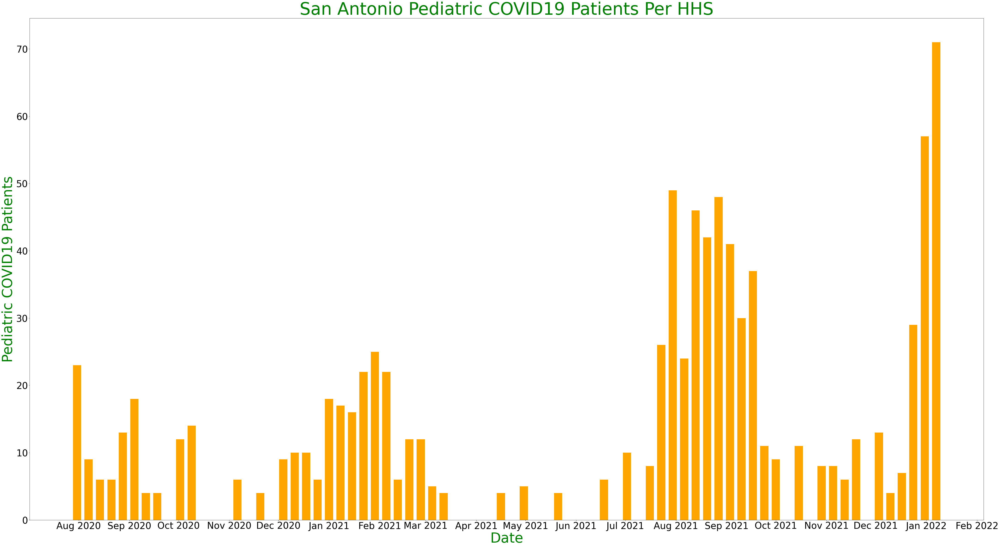

In [62]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('San Antonio Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_sa_ped.date, df_sa_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_San_Antonio_Pediatric.png')

In [63]:
aaa = df_covid_hospital[df_covid_hospital.state == 'NY']

In [64]:
date_list = aaa.collection_week.unique()
date_list.sort()
ny_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ny_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ny_ped = pd.DataFrame(ny_ped_list, columns = ['date', 'ped_count'])

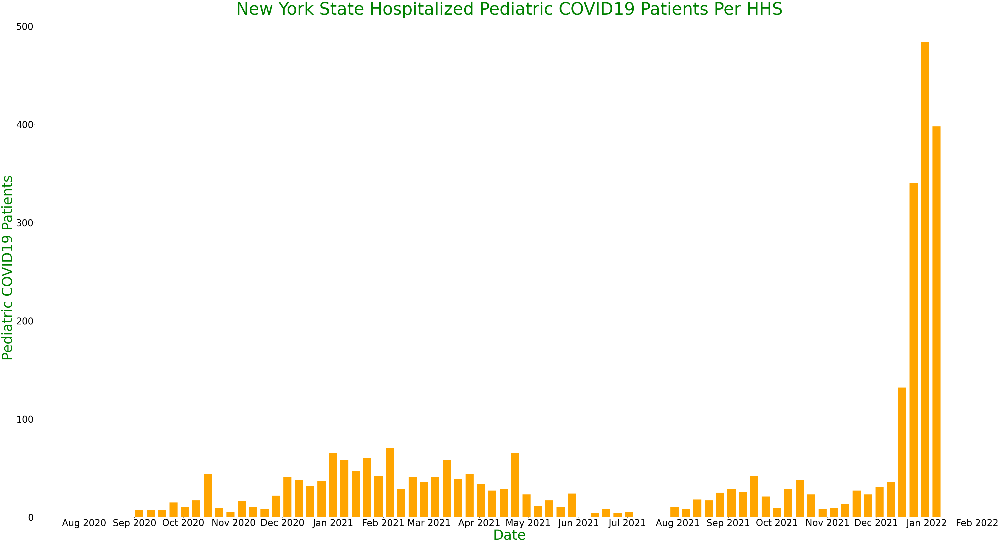

In [65]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('New York State Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ny_ped.date, df_ny_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_NY_Pediatric.png')

In [71]:
aaa = df_covid_hospital[df_covid_hospital.state == 'TX']
date_list = aaa.collection_week.unique()
date_list.sort()
tx_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    tx_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_tx_ped = pd.DataFrame(tx_ped_list, columns = ['date', 'ped_count'])

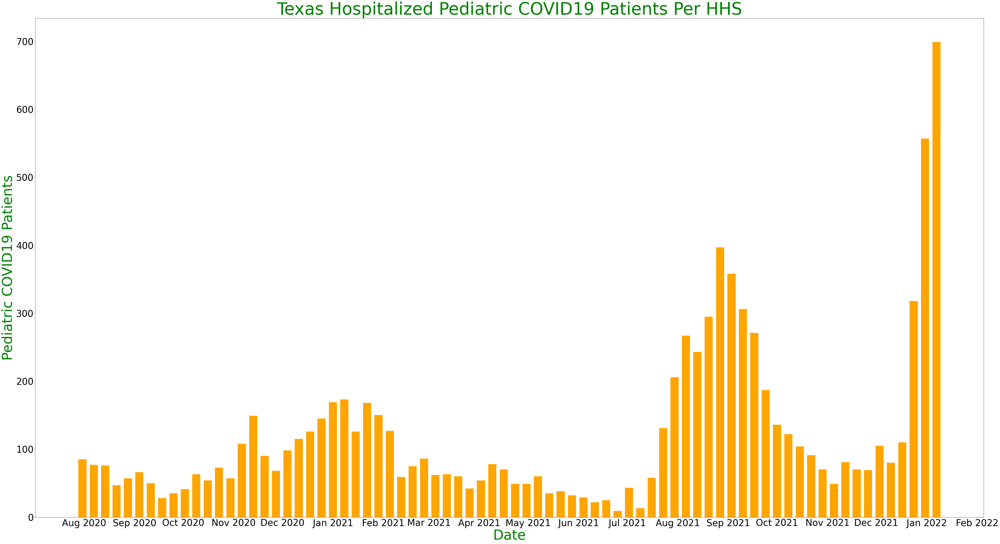

In [72]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Texas Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_tx_ped.date, df_tx_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_TX_Pediatric.png')

In [73]:
aaa = df_covid_hospital[df_covid_hospital.state == 'CA']
date_list = aaa.collection_week.unique()
date_list.sort()
ca_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ca_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ca_ped = pd.DataFrame(ca_ped_list, columns = ['date', 'ped_count'])

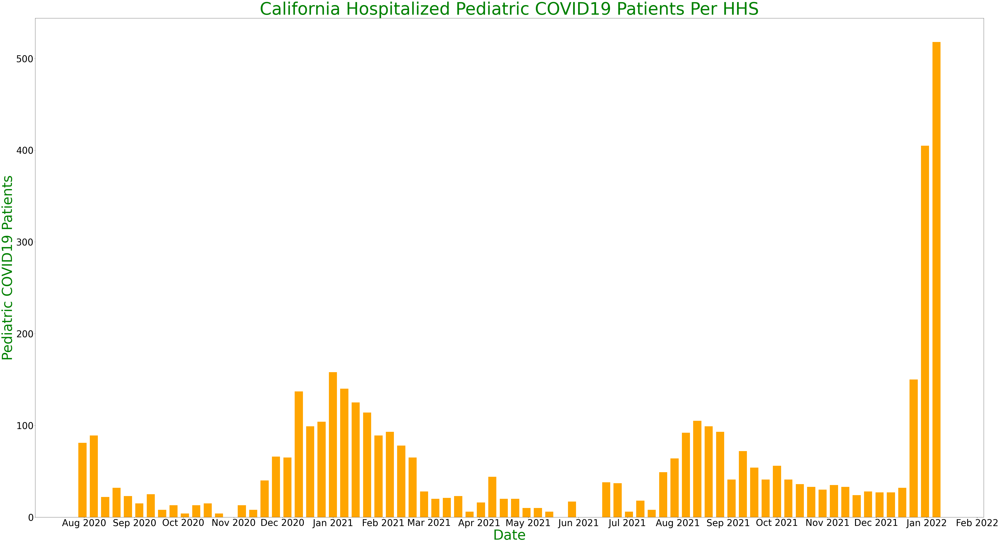

In [74]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('California Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ca_ped.date, df_ca_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_CA_Pediatric.png')

In [75]:
aaa = df_covid_hospital
date_list = aaa.collection_week.unique()
date_list.sort()
us_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    us_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_us_ped = pd.DataFrame(us_ped_list, columns = ['date', 'ped_count'])

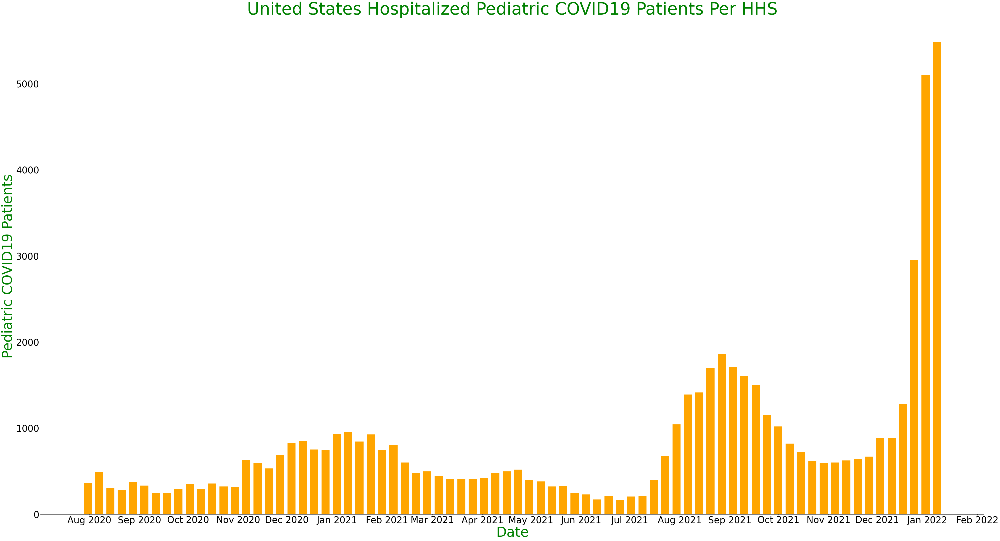

In [76]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('United States Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_us_ped.date, df_us_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_US_Pediatric.png')

In [77]:
aaa = df_covid_hospital
date_list = aaa.collection_week.unique()
date_list.sort()
us_adult_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_adult_covid_confirmed_7_day_sum >= 0]
    #print()
    us_adult_list.append((x, ccc.previous_day_admission_adult_covid_confirmed_7_day_sum.sum()))
df_us_adult = pd.DataFrame(us_adult_list, columns = ['date', 'adult_count'])

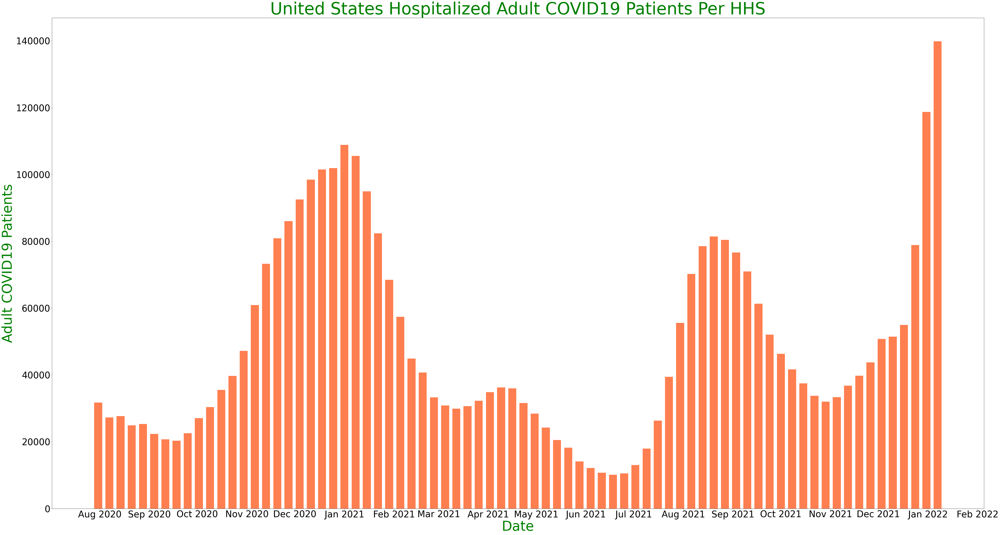

In [79]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('United States Hospitalized Adult COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Adult COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_us_adult.date, df_us_adult.adult_count, color = 'coral', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_US_Adult.png')

staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum 

In [81]:
aaa = df_covid_hospital
date_list = aaa.collection_week.unique()
date_list.sort()
us_adult_icu_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum >= 0]
    #print()
    us_adult_icu_list.append((x, ccc.staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum.sum()))
df_us_adult_icu = pd.DataFrame(us_adult_icu_list, columns = ['date', 'adult_icu_count'])

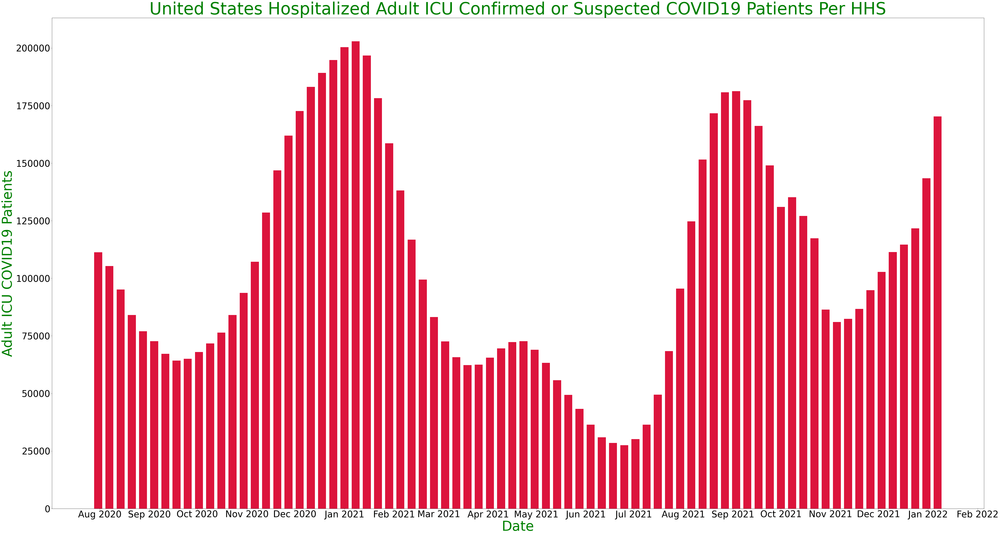

In [83]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('United States Hospitalized Adult ICU Confirmed or Suspected COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Adult ICU COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_us_adult_icu.date, df_us_adult_icu.adult_icu_count, color = 'crimson', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_US_Adult_ICU.png')